## Trigger Word Detection
* Construct a speech dataset and implement an algorithm for trigger word detection.
* Trigger word will be "Activate." Every time it hears you say "activate," it will make a "chiming" sound.

In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from td_utils import *
%matplotlib inline

/home/prasanna/anaconda3/lib/python3.7/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


### Data synthesis: Creating a speech dataset 

* The "activate" directory contains positive examples of people saying the word "activate". 
* The "negatives" directory contains negative examples of people saying random words other than "activate". 
* There is one word per audio recording. 
* The "backgrounds" directory contains 10 second clips of background noise in different environments.

In [2]:
IPython.display.Audio("./raw_data/activates/1.wav")

In [3]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [4]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

#### From audio recordings to spectrograms
#### Spectrogram
* In  order to help the sequence model more easily learn to detect trigger words, compute a *spectrogram* of the audio. 
* The spectrogram tells how much different frequencies are present in an audio clip at any moment in time. 
* A spectrogram is computed by sliding a window over the raw audio signal, and calculating the most active frequencies in each window using a Fourier transform. 

In [5]:
IPython.display.Audio("audio_examples/example_train.wav")

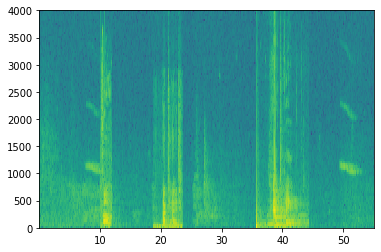

In [6]:
x = graph_spectrogram("audio_examples/example_train.wav")

The graph above represents how active each frequency is (y axis) over a number of time-steps (x axis). 
* The color in the spectrogram shows the degree to which different frequencies are present (loud) in the audio at different points in time. 
* Green means a certain frequency is more active or more present in the audio clip (louder). Blue squares denote less active frequencies.
* The dimension of the output spectrogram depends upon the hyperparameters of the spectrogram software and the length of the input. 
* 10 second audio clips as the "standard length" for our training examples. 
* The number of timesteps of the spectrogram will be 5511. 
* The spectrogram will be the input $x$ into the network, and so $T_x = 5511$.

In [7]:
_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


In [8]:
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

#### Dividing into time-intervals
* Raw audio divides 10 seconds into 441,000 units.
* A spectrogram divides 10 seconds into 5,511 units.
    * $T_x = 5511$
* The output of the model will divide 10 seconds into 1,375 units.
    * $T_y = 1375$
    * For each of the 1375 time steps, the model predicts whether someone recently finished saying the trigger word "activate." 

In [9]:
Ty = 1375 # The number of time steps in the output of our model

### Generating a single training example
* To synthesize a single training example:
    - Pick a random 10 second background audio clip
    - Randomly insert 0-4 audio clips of "activate" into this 10sec clip
    - Randomly insert 0-2 audio clips of negative words into this 10sec clip

In [10]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio()

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len: \n" + str(len(activates[0])),"\n")
print("activate[1] len: \n" + str(len(activates[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len: 
668 

activate[1] len: 
731 



#### Overlaying positive/negative 'word' audio clips on top of the background audio  and Label the positive/negative words
* $y^{\langle t \rangle} = 1$ when that that clip has finished saying "activate".
* Given a background clip, initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activates." 
* When an "activate" clip is overlayed, labels for $y^{\langle t \rangle}$ will be updated.
    * Rather than updating the label of a single time step, update 50 steps of the output to have target label 1 to make the training data more balanced. 
    

<img src="images/label_diagram.png" style="width:500px;height:200px;">

In [11]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms)  
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [12]:

def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    overlap = False
    
   
    for previous_start, previous_end in previous_segments:
        if (segment_start <= previous_start <= segment_end) or (segment_start <= previous_end <= segment_end):
            overlap = True
   

    return overlap

In [13]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    
    segment_ms = len(audio_clip)
    segment_time = get_random_time_segment(segment_ms)
    
    while is_overlapping(segment_time,previous_segments):
        segment_time = get_random_time_segment(segment_ms)

    
    previous_segments.append(segment_time)
    new_background = background.overlay(audio_clip, position = segment_time[0])
    
    return new_background, segment_time

In [14]:
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (5083, 5750)


In [15]:
def insert_ones(y, segment_end_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. The label of segment_end_y should be 0 while, the 50 following labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[0, i] = 1
    
    
    return y

In [16]:
def create_training_example(background, activates, negatives):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a 10 second background audio recording
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    
    # Make background quieter
    background = background - 20
    y = np.zeros((1,Ty))
    
    previous_segments = []
    
    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
   
    for random_activate in random_activates:
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background,random_activate,previous_segments)
        
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        
        # Insert labels in "y"
        y = insert_ones(y,segment_end)
        
    

    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]


    for random_negative in random_negatives:
        # Insert the audio clip on the background 
        
        background, _ = insert_audio_clip(background,random_negative,previous_segments)
    
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    
    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")
    
    
    x = graph_spectrogram("train.wav")
    
    return x, y

File (train.wav) was saved in your directory.


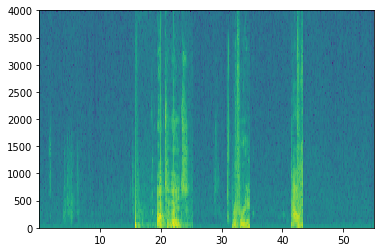

In [87]:
x, y = create_training_example(backgrounds[0], activates, negatives)

In [88]:
IPython.display.Audio("train.wav")

#### Load the data generated by the above method

In [19]:
# Load preprocessed training examples
X = np.load("./Data/XY_train/X.npy")
Y = np.load("./Data/XY_train/Y.npy")

# Load preprocessed dev set examples
X_dev = np.load("./Data/XY_dev/X_dev.npy")
Y_dev = np.load("./Data/XY_dev/Y_dev.npy")




In [30]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam

<img src="images/model.png" style="width:600px;height:600px;">
<center> Model Architecture </center>

In [31]:
def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    X = Conv1D(filters=196,kernel_size=15,strides=4)(X_input)# CONV1D
    X = BatchNormalization()(X)                              # Batch normalization
    X = Activation("relu")(X)                                # ReLu activation
    X = Dropout(rate = 0.8)(X)                               # dropout 

    
    X = GRU(units=128, return_sequences = True, reset_after = True, recurrent_activation='sigmoid')(X)          # GRU
    X = Dropout(rate = 0.8)(X)                              # dropout
    X = BatchNormalization()(X)                             # Batch normalization
    
    
    X = GRU(units=128, return_sequences = True, reset_after = True, recurrent_activation='sigmoid')(X)          # GRU 
    X = Dropout(rate = 0.8)(X)                              # dropout 
    X = BatchNormalization()(X)                             # Batch normalization
    X = Dropout(rate = 0.8)(X)                              # dropout 
    
    
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X)# time distributed  (sigmoid)
    #creates a dense layer followed by a sigmoid, so that the parameters used for the dense layer 
    #are the same for every time step.

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [32]:
model = model(input_shape = (Tx, n_freq))


In [33]:
model.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_3 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_1 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 1375, 196)         0         
_________________________________________________________________
gru_2 (GRU)                  (None, 1375, 128)         125184    
_________________________________________________________________
dropout_5 (Dropout)          (None, 1375, 128)        

In [34]:
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [71]:
model.fit(X, Y, batch_size = 5, epochs=100)

Epoch 1/100
6/6 [==============================] - 7s 1s/step - loss: 0.8393 - accuracy: 0.8198
Epoch 2/100
6/6 [==============================] - 9s 2s/step - loss: 0.8416 - accuracy: 0.8294
Epoch 3/100
6/6 [==============================] - 11s 2s/step - loss: 0.8404 - accuracy: 0.8258
Epoch 4/100
6/6 [==============================] - 8s 1s/step - loss: 0.8390 - accuracy: 0.8179
Epoch 5/100
6/6 [==============================] - 8s 1s/step - loss: 0.8188 - accuracy: 0.8113
Epoch 6/100
6/6 [==============================] - 9s 1s/step - loss: 0.8463 - accuracy: 0.8260
Epoch 7/100
6/6 [==============================] - 8s 1s/step - loss: 0.8315 - accuracy: 0.8275
Epoch 8/100
6/6 [==============================] - 9s 2s/step - loss: 0.8314 - accuracy: 0.8144
Epoch 9/100
6/6 [==============================] - 10s 2s/step - loss: 0.8434 - accuracy: 0.8200
Epoch 10/100
6/6 [==============================] - 9s 1s/step - loss: 0.8468 - accuracy: 0.8037
Epoch 11/100
6/6 [===================

6/6 [==============================] - 9s 1s/step - loss: 0.8244 - accuracy: 0.8397
Epoch 86/100
6/6 [==============================] - 9s 1s/step - loss: 0.8228 - accuracy: 0.8298
Epoch 87/100
6/6 [==============================] - 8s 1s/step - loss: 0.8103 - accuracy: 0.8367
Epoch 88/100
6/6 [==============================] - 8s 1s/step - loss: 0.8279 - accuracy: 0.8263
Epoch 89/100
6/6 [==============================] - 9s 1s/step - loss: 0.8294 - accuracy: 0.8387
Epoch 90/100
6/6 [==============================] - 10s 2s/step - loss: 0.8213 - accuracy: 0.8378
Epoch 91/100
6/6 [==============================] - 9s 2s/step - loss: 0.8234 - accuracy: 0.8431
Epoch 92/100
6/6 [==============================] - 9s 2s/step - loss: 0.8317 - accuracy: 0.8282
Epoch 93/100
6/6 [==============================] - 9s 1s/step - loss: 0.8207 - accuracy: 0.8256
Epoch 94/100
6/6 [==============================] - 8s 1s/step - loss: 0.8167 - accuracy: 0.8374
Epoch 95/100
6/6 [========================

In [ ]:
model.save("my_model")

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


In [72]:
loss, acc = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 0s 1ms/step - loss: 0.5692 - accuracy: 0.9306
Dev set accuracy =  0.930618166923523


In [73]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [74]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    consecutive_timesteps = 0
    for i in range(Ty):
        consecutive_timesteps += 1
        if predictions[0,i,0] > threshold and consecutive_timesteps > 75:
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

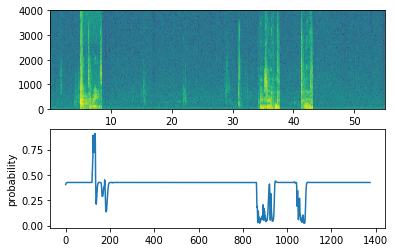

In [130]:
filename  = "./train.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("chime_output.wav")